In [1]:
# install libraries if not installed
%pip install pandas numpy matplotlib seaborn geopandas pysal scikit-learn scipy

In [2]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import folium

from pysal.lib import weights
from sklearn.preprocessing import StandardScaler
from scipy import stats
from splot.libpysal import plot_spatial_weights
from splot.esda import moran_scatterplot
from esda.moran import Moran, Moran_Local

# suppress warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# function definitiions
import os
import datetime

def filter_by_country(code, df, country):
    # if country is not in the dataframe, return the dataframe
    if country not in df['country_name'].values:
        print(f"\033[91mCountry: {country} not found in the dataframe:{code}\033[0m")
    return df[df['country_name'] == country]

def makeOutputDir(directory):
    # create output directory if not exists
    date = datetime.datetime.now().strftime("%Y%m%d")
    output_dir = f'./outputs/{date}/{directory}'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)
    return output_dir

# Load the data
- Load all the observation
- Define all the codes of the dataset
- Create a new geometry column for each dataset
- Filter the dataset by country to remove non-mexico data
- Check if all the required columns exist
- Rename value_avg to value and ensure it is of type float
- Convert to geopandas dataframe
- Save to csv

In [4]:
## main defines
countryName = "Mexico"
geoJSON = {
    'Mexico': './data/mexico_.geojson',
    'Guatemala': './data/guatemala-with-regions_.geojson'
}

In [5]:
# base path
base_path = './data/WoSIS_2023_December/'

# load observation dataset
observations = pd.read_csv(f'{base_path}wosis_202312_observations.tsv', sep='\t')

# column codes
codes = ["bdfi33", "bdfiad", "bdfifm", "bdfiod", "bdwsod", "cecph7", "cecph8", "cfgr", "cfvo", "clay", "ecec", "elco20", "elco25", "elco50", "elcosp", 
         "nitkjd", "orgc", "orgm", "phaq", "phca", "phetb1", "phetm3", "phetol", "phkc", "phnf", "phprtn", "phptot", "phpwsl", "sand", "silt", "tceq", "totc", 
         "wg0006", "wg0010", "wg0033", "wg0100", "wg0200", "wg0500", "wg1500", "wv0010", "wv0033", "wv0100", "wv0500", "wv1500"]

from shapely.geometry import Point

# selective important columns
valid_columns = ['profile_id', 'layer_id', 'layer_name', 'date', 'country_name', 'longitude', 'latitude', 'upper_depth', 'lower_depth', 'value_avg', 'geometry']

# make output directory
gdf_path = makeOutputDir(f'{countryName}_wosis')

# valid codes
valid_codes = []

# pre-process the dataset
for code in codes:
    df = pd.read_csv(f'{base_path}/wosis_202312_{code}.tsv', sep='\t', dtype={'upper_depth': float, 'lower_depth': float, 'value_avg': float})
    # filter by country
    df = filter_by_country(code, df, countryName)

    if not df.empty:
        # create geometry column
        df['geometry'] = df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)

        # check columns exist
        for column in valid_columns:
            if column not in df.columns:
                print(f"\033[91mColumn {column} not found in the dataframe:{code}\033[0m")
                continue

        # add to valid codes
        valid_codes.append(code)

        # select only the valid columns
        df = df[valid_columns].copy()

        # rename value_avg to value and ensure it is of type float
        df = df.rename(columns={'value_avg': 'value'})

        # convert to geopandas dataframe
        gdf = gpd.GeoDataFrame(df, geometry='geometry')

        gdf.crs = {'init': 'epsg:4326'}
        # save to csv
        gdf.to_csv(f'{gdf_path}/{code}_{countryName}.csv', index=False)

Country: Mexico not found in the dataframe:bdfiad
Country: Mexico not found in the dataframe:bdfifm
Country: Mexico not found in the dataframe:cecph8
Country: Mexico not found in the dataframe:elco25
Country: Mexico not found in the dataframe:elco50
Country: Mexico not found in the dataframe:orgm
Country: Mexico not found in the dataframe:phetm3
Country: Mexico not found in the dataframe:phetol
Country: Mexico not found in the dataframe:phptot
Country: Mexico not found in the dataframe:phpwsl
Country: Mexico not found in the dataframe:wg0100
Country: Mexico not found in the dataframe:wg0500
Country: Mexico not found in the dataframe:wv0010
Country: Mexico not found in the dataframe:wv0033
Country: Mexico not found in the dataframe:wv0100
Country: Mexico not found in the dataframe:wv0500
Country: Mexico not found in the dataframe:wv1500


# Pre-process the dataset
- Remove negative values
- Explore missing values
- Plot the histogram of code and missing values heatmap

In [6]:
# plot for every code but in 1 image
fig, axes = plt.subplots(len(valid_codes), 2, figsize=(20, 8*len(valid_codes)), dpi=300)

for i, code in enumerate(valid_codes):
    # read code_mexico.tsv
    gdf = pd.read_csv(f'{gdf_path}/{code}_{countryName}.csv')
    gdf['value'] = gdf['value'].astype(float)

    # remove negative values
    gdf = gdf[gdf['value'] > 0]

    # plot the histogram of code and missing values heatmap
    axes[i, 0].hist(gdf['value'], bins=100)
    axes[i, 0].set_title(f'Histogram of {code}')

    sns.heatmap(gdf.isnull(), cbar=False, cmap='viridis', ax=axes[i, 1])
    axes[i, 1].set_title(f'Missing values heatmap of {code}')

plt.suptitle(f"Missing values and Frequency of data for country:{countryName}")
plt.tight_layout()
plt.savefig(f'{gdf_path}/histogram_and_missing_values_heatmap.png', dpi=300)
plt.show()

## Observations
- There are no missing values for important columns in the dataset
- The values are not normally distributed

# Remove outliers
- Remove values that are more than 3 standard deviations from the mean


In [7]:
len(valid_codes)

27

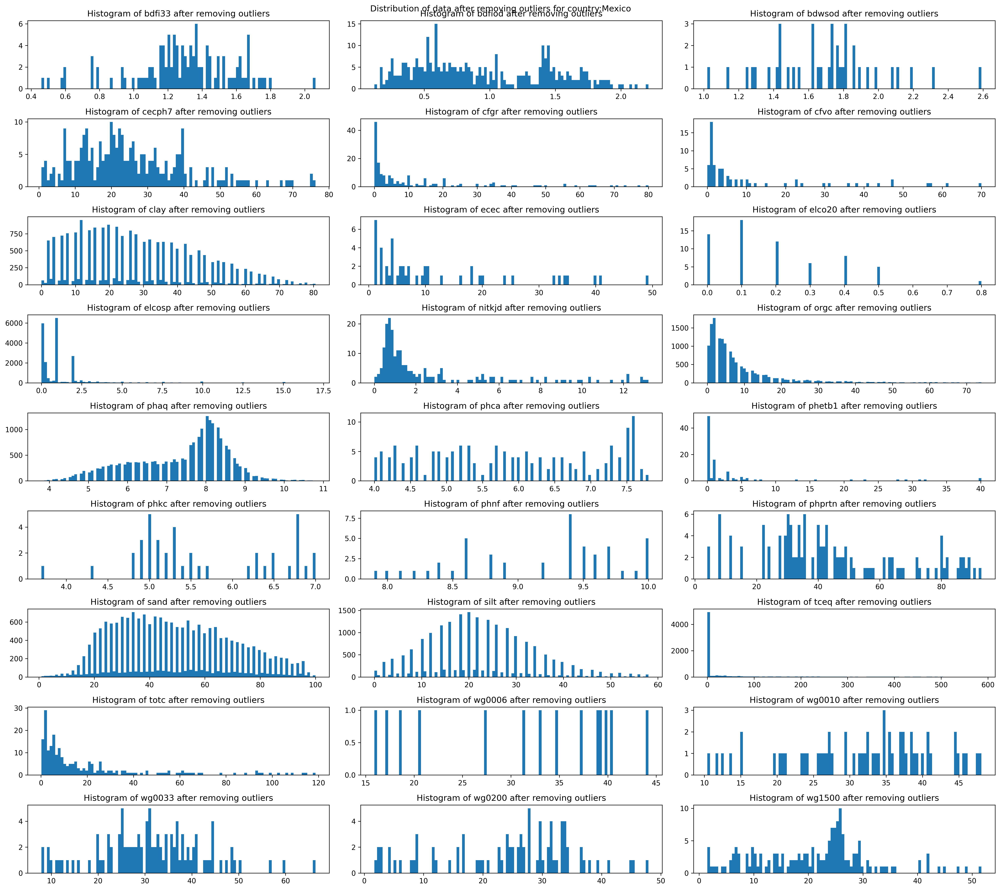

In [8]:
# remove outliers and plot in a single figure with 3 plots in a row
fig, axes = plt.subplots(9, 3, figsize=(20, 6*3), dpi=300)

# length of each code after removing outliers
lengths = []
for i, code in enumerate(valid_codes):
    gdf = pd.read_csv(f'{gdf_path}/{code}_{countryName}.csv')
    gdf['value'] = gdf['value'].astype(float)

    # remove outliers using z-score
    z_scores = np.abs((gdf['value'] - gdf['value'].mean()) / gdf['value'].std())
    gdf = gdf[z_scores < 3]

    # length of each code after removing outliers
    lengths.append(len(gdf))

    # plot the histogram of removed outliers
    axes[i//3, i%3].hist(gdf['value'], bins=100)
    axes[i//3, i%3].set_title(f'Histogram of {code} after removing outliers')

plt.suptitle(f"Distribution of data after removing outliers for country:{countryName}")
plt.tight_layout()
plt.savefig(f'{gdf_path}/histograms_of_codes_after_removing_outliers.png', dpi=300)
plt.show()


## Explore the length of each code after removing outliers

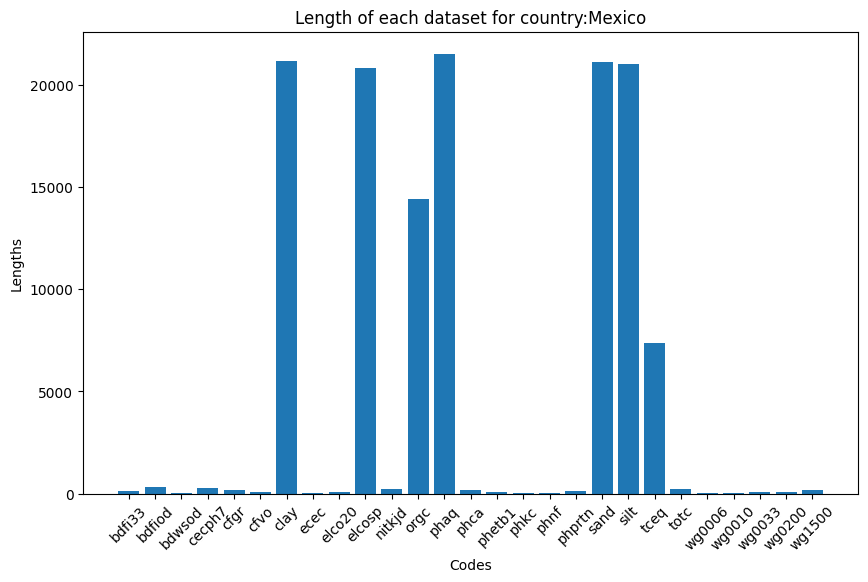

In [9]:
# plot lengths
plt.figure(figsize=(10, 6))
plt.bar(valid_codes, lengths)
plt.xlabel('Codes')
plt.ylabel('Lengths')
plt.title('Lengths of codes after removing outliers')
plt.xticks(rotation=45)
plt.savefig(f'{gdf_path}/lengths_of_codes_after_removing_outliers.png', dpi=300)
plt.title(f"Length of each dataset for country:{countryName}")
plt.show()

## Feature selection 
- Select the codes with more than 5000 records

In [10]:
feature_codes = ['clay', 'elcosp', 'orgc', 'phaq', 'sand', 'silt', 'tceq']
# feature_codes = [code for code in valid_codes if lengths[valid_codes.index(code)] > 5000]
feature_codes

['clay', 'elcosp', 'orgc', 'phaq', 'sand', 'silt', 'tceq']

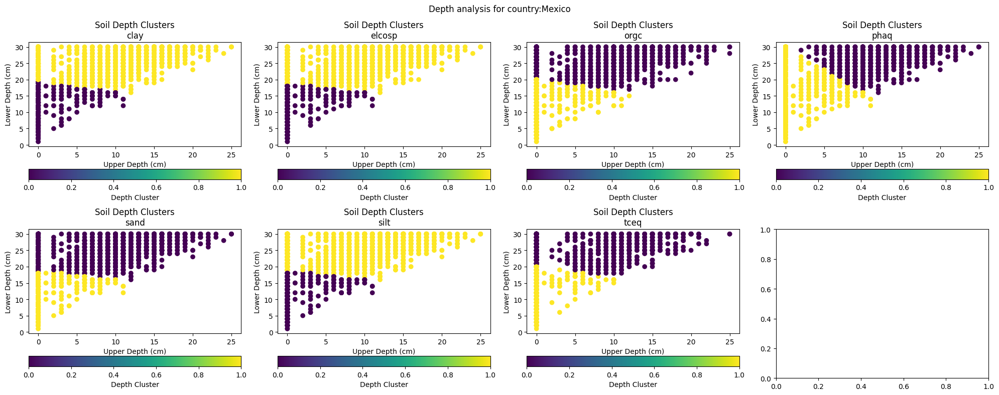

In [11]:
from sklearn.cluster import KMeans
# Create a figure with subplots in 4 columns and 2 rows
fig, axes = plt.subplots(2, 4, figsize=(20, 8))

# Flatten the axes array to iterate over it
axes = axes.flatten()

after_lengths = []
for i, code in enumerate(feature_codes):
    # load orgc_mexico points data
    df = pd.read_csv(f'{gdf_path}/{code}_{countryName}.csv')

    # clean the dataframe
    # remove rows with upper_depth or lower_depth greater than 30
    df = df[df['upper_depth'] <= 30]
    df = df[df['lower_depth'] <= 30]

    # convert depth columns to numpy array for clustering
    depth_coords = df[['upper_depth', 'lower_depth']].values

    after_lengths.append(len(df))

    # perform KMeans clustering on depth values
    kmeans = KMeans(n_clusters=2, random_state=42).fit(depth_coords)

    # add cluster labels to the dataframe
    df['depth_cluster'] = kmeans.labels_

    # plot the depth clusters
    scatter = axes[i].scatter(df['upper_depth'], df['lower_depth'], c=df['depth_cluster'], cmap='viridis')
    axes[i].set_xlabel('Upper Depth (cm)')
    axes[i].set_ylabel('Lower Depth (cm)')
    axes[i].set_title(f'Soil Depth Clusters\n{code}')
    plt.colorbar(scatter, ax=axes[i], orientation='horizontal', label='Depth Cluster')

    # save data
    df.to_csv(f'{gdf_path}/{code}_{countryName}_depth_clusters.csv', index=False)

plt.suptitle(f"Depth analysis for country:{countryName}")
plt.tight_layout()
plt.show()

# Length of each code after using only 0 - 30cm depth

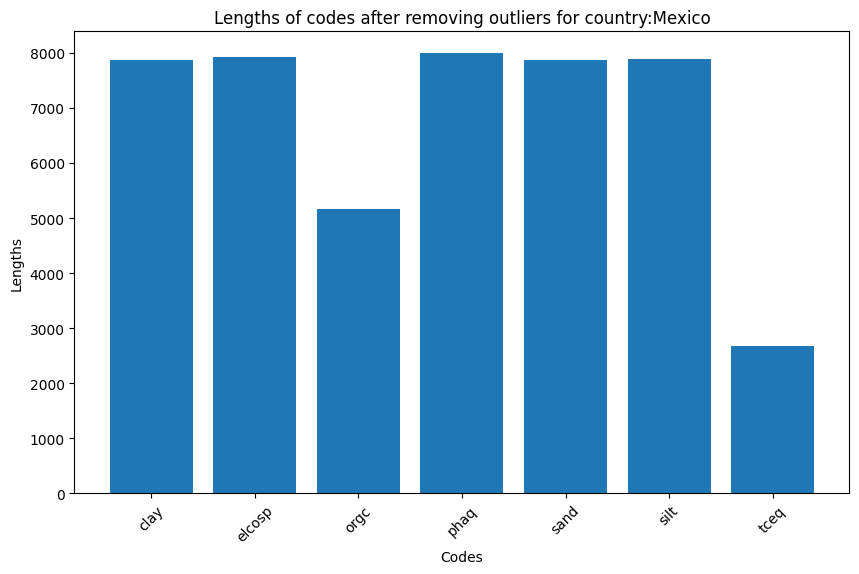

In [12]:
# plot lengths
plt.figure(figsize=(10, 6))
plt.bar(feature_codes, after_lengths)
plt.xlabel('Codes')
plt.ylabel('Lengths')
plt.title(f'Lengths of codes after removing outliers for country:{countryName}')
plt.xticks(rotation=45)
plt.savefig(f'{gdf_path}/lengths_of_codes_after_removing_depths.png', dpi=300)
plt.show()

# Creating the Dataset

## Load Mexico Geojson file

In [13]:
# load mexico geojson
jsonPath = "./data/mexico.geojson" #geoJSON[countryName]
mexico_gdf = gpd.read_file(jsonPath)
mexico_gdf.head()

DataSourceError: ./data/mexico_.geojson: No such file or directory

## Merge the columns into single dataframe

In [14]:
for i, feature in enumerate(feature_codes):
    feat_df = pd.read_csv(f'{gdf_path}/{feature}_{countryName}_depth_clusters.csv')

    feat_df = feat_df[['longitude', 'latitude', 'value', 'depth_cluster']]

    geometry = [Point(xy) for xy in zip(feat_df.longitude, feat_df.latitude)]
    crs = {'init': 'EPSG:4326'}
    feat_df = gpd.GeoDataFrame(feat_df, crs=crs, geometry=geometry)

    mexico_gdf = mexico_gdf.to_crs("EPSG:4326")
    feat_df = feat_df.to_crs("EPSG:4326")

    df_with_state = gpd.sjoin(feat_df, mexico_gdf[['name', 'geometry']], how="left", predicate="within")

    df_with_state = df_with_state.drop(columns=['index_right'])

    # group by state and calculate the mean of value
    mean_depth_value = df_with_state['value'].groupby([df_with_state['name']]).median()

    mexico_gdf = mexico_gdf.join(mean_depth_value, on='name')
    mexico_gdf.rename(columns={'value': f'{feature}_median_value'}, inplace=True)

In [ ]:
# mexico_gdf = mexico_gdf.drop(columns=['created_at', 'updated_at', 'cartodb_id'])
mexico_gdf.rename(columns={'name': 'state'}, inplace=True)
mexico_gdf.head()

# ESDA

## Spatial distribution of median values

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(20, 5*3))
for i, feature in enumerate(feature_codes):
    mexico_gdf.plot(column=f'{feature}_median_value', scheme='Quantiles', k=5, cmap='viridis', legend=True, ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f'Median Value of {feature} by State')

plt.show()

## Spatial Similarity

In [17]:
import libpysal as lps
import mapclassify as mc

df = mexico_gdf
wq =  lps.weights.Queen.from_dataframe(df)
wq.transform = 'r'

In [ ]:
for i, feature in enumerate(feature_codes):
        y = df[f'{feature}_median_value']
        ylag = lps.weights.lag_spatial(wq, y)

        df[f'{feature}_median_lag'] = ylag
        f,ax = plt.subplots(1,2,figsize=(20, 4))
        df.plot(column=f'{feature}_median_value', ax=ax[0], edgecolor='k',
                scheme="quantiles",  k=5, cmap='viridis', legend=True)
        ax[0].axis(df.total_bounds[np.asarray([0,2,1,3])])
        ax[0].set_title(f"{feature.upper()}")
        df.plot(column=f'{feature}_median_lag', ax=ax[1], edgecolor='k',
                scheme='quantiles', cmap='viridis', k=5, legend=True)
        ax[1].axis(df.total_bounds[np.asarray([0,2,1,3])])
        ax[1].set_title(f"Spatial Lag {feature.upper()}")
        ax[0].axis('off')
        ax[1].axis('off')
        plt.show()

In [ ]:
df.head()

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(20, 5*3))
for i, feature in enumerate(feature_codes):
    y = df[f'{feature}_median_value']
    # print(feature, y.median())
    yb = y > y.median()
    # print(f'Sum of {feature}:', sum(yb))
    yb = y > y.median()
    labels = ["0 Low", "1 High"]
    yb = [labels[i] for i in 1*yb] 
    df[f'{feature}_yb'] = yb

    df.plot(column=f'{feature}_yb', cmap='binary', edgecolor='grey', legend=True, ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f'Values above(1) and below(0) median {feature}')
plt.show()

## Hotspots & Coldpsots

In [21]:
import esda
from matplotlib import colors

In [ ]:
hmap = colors.ListedColormap(['red', 'lightgrey'])

fig, axes = plt.subplots(3, 3, figsize=(20, 5*3))
for i, feature in enumerate(feature_codes):
        y = df[f'{feature}_median_value']

        li = esda.moran.Moran_Local(y, wq)
        sig = li.p_sim < 0.05
        hotspot = sig * li.q==1
        
        spots = ['n.sig.', 'hot spot']
        labels = [spots[i] for i in hotspot*1]

        df.assign(cl=labels).plot(column='cl', categorical=True, \
                k=2, cmap=hmap, linewidth=0.1, ax=axes[i//3, i%3], \
                edgecolor='white', legend=True)
        axes[i//3, i%3].set_axis_off()
        axes[i//3, i%3].set_title(f'Hostpots for {feature.upper()}')
plt.show()

In [ ]:
hmap = colors.ListedColormap(['blue', 'lightgrey'])

fig, axes = plt.subplots(3, 3, figsize=(20, 5*3))
for i, feature in enumerate(feature_codes):
        y = df[f'{feature}_median_value']

        li = esda.moran.Moran_Local(y, wq)
        sig = li.p_sim < 0.05
        coldspot = sig * li.q==3
        
        spots = ['n.sig.', 'cold spot']
        labels = [spots[i] for i in coldspot*1]

        df.assign(cl=labels).plot(column='cl', categorical=True, \
                k=2, cmap=hmap, linewidth=0.1, ax=axes[i//3, i%3], \
                edgecolor='white', legend=True)
        axes[i//3, i%3].set_axis_off()
        axes[i//3, i%3].set_title(f'Coldspots for {feature.upper()}')
plt.show()

In [ ]:
print(len(mexico_gdf))
# Plot missing values heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

# Final Dataset

In [ ]:
gdf_geojson = gpd.read_file('./data/mexico_.geojson')
gdf = gpd.GeoDataFrame(columns=['latitude', 'longitude'])

# drop columns not required
if 'sand' in feature_codes:
    feature_codes.remove('sand')

for i, feature in enumerate(feature_codes):
    feat_df = pd.read_csv(f'{gdf_path}/{feature}_mexico_depth_clusters.csv')

    feat_df = feat_df[['longitude', 'latitude', 'value', 'depth_cluster']]
    feat_df = feat_df.rename(columns={'value': feature, 'depth_cluster': f'{feature}_depth_cluster'})

    gdf = gdf.merge(feat_df, on=['latitude', 'longitude'], how='outer')

# create organic matter
gdf[f'OM'] = gdf.apply(lambda row: 1.724 * row['orgc'].astype('float'), axis=1)

# create bulk density
gdf[f'BD'] = gdf.apply(lambda row: 1.62-0.06 * row['OM'].astype('float'), axis=1)

gdf[f'SOC_th'] = gdf.apply(lambda row: (row['orgc'].astype('float')/1000) * 30 , axis=1)

gdf[f'silt_plus_clay'] = gdf.apply(lambda row: row['silt'] + row['clay'] , axis=1)

# drop silt and clay
gdf = gdf.drop(columns=['silt', 'clay'])

gdf['geometry'] = gdf.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
gdf = gpd.GeoDataFrame(gdf, geometry='geometry')

gdf = gpd.sjoin(gdf, gdf_geojson[['name', 'geometry']], how="left", predicate="within")
gdf = gdf.drop(columns=['index_right'])
gdf.head()

## Split Datasets

In [ ]:
gdf.to_csv("data/curation/mexico_df.csv", index=False)

orgc_df = gdf.drop(columns=['tceq', 'tceq_depth_cluster'])
orgc_df.to_csv("data/curation/orgc_df.csv", index=False)

tceq_df = gdf.drop(columns=['orgc', 'orgc_depth_cluster'])
tceq_df.to_csv("data/curation/tceq_df.csv", index=False)

fig, axes = plt.subplots(1, 2, figsize=(20,6))

sns.heatmap(orgc_df.isnull(), cbar=False, cmap='viridis', ax=axes[0])
axes[0].set_title('Missing values in ORGC dataset')

sns.heatmap(tceq_df.isnull(), cbar=False, cmap='viridis', ax=axes[1])
axes[1].set_title('Missing values in TCEQ dataset')

plt.show()

In [ ]:
# replace missing values with before fill
orgc_df = orgc_df.fillna(method='bfill', axis=0)
tceq_df = tceq_df.fillna(method='bfill', axis=0)

# correlation matrix for imputed on selected columns
corr_matrix = orgc_df[['elcosp', 'phaq', 'silt_plus_clay', 'OM', 'BD', 'SOC_th', 'orgc']].corr()
corr_matrix2 = tceq_df[['elcosp', 'phaq', 'silt_plus_clay', 'OM', 'BD', 'SOC_th', 'tceq']].corr()


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=ax1)
ax1.set_title('Correlation Matrix for ORGC on Selected Columns')

sns.heatmap(corr_matrix2, annot=True, cmap='coolwarm', ax=ax2)
ax2.set_title('Correlation Matrix for TCEQ on Selected Columns')

plt.show()

In [ ]:
col_names = ['BD', 'OM', 'SOC_th', 'orgc']

fig, axes = plt.subplots(2, 2, figsize=(20, 6 * 2))
for c, colname in enumerate(col_names):
    sns.histplot(orgc_df[colname], kde=True, ax=axes[c//2, c%2])
    axes[c//2, c%2].set_title(f'Distribution for {colname}')
    # axes[c//2, c%2].set_xlim(-10, 200)

plt.suptitle("Distribution for organic carbon dataset")
plt.show()